# Jan Stryszewski lab 07
## Extension of the SDM Coagulation Solver: Multi-threading & GPU Support

In [2]:
!pip install open_atmos_jupyter_utils

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 21.2 MB/s eta 0:00:00


In [3]:
"""notebook code targetting >90% `nbqa pylint` score! :)"""

from collections import OrderedDict
from copy import deepcopy
from itertools import combinations
from time import perf_counter
from types import SimpleNamespace

import matplotlib.pyplot as plt
import numpy as np
import scipy
from numba import get_num_threads, njit, prange
from open_atmos_jupyter_utils import show_plot

print("Number of available threads: ", get_num_threads())

Number of available threads:  2


# Implementation

In [4]:
PARAMS_PHYSICAL = SimpleNamespace(
    n0 = 2**23,  # number of particles
    dv_m3 = 1e6,  # volume of the system, e.g. container
    x0_kg = 1.192e-13,
    b_per_s = 1500,  # rate of coagulation per second
)
PARAMS_PHYSICAL.dist = scipy.stats.expon(loc=0, scale=PARAMS_PHYSICAL.x0_kg)
PARAMS_PHYSICAL.norm = PARAMS_PHYSICAL.n0 * PARAMS_PHYSICAL.dv_m3

PARAMS_COMPUTATIONAL = SimpleNamespace(
    n_part = 2**11,  # number of computational particles
    t_max_s = 3600,  # how long to run the simulation (seconds)
    n_step = 1800,  # number of time steps to take
)
PARAMS_COMPUTATIONAL.dt_s = PARAMS_COMPUTATIONAL.t_max_s / PARAMS_COMPUTATIONAL.n_step

# parameters for ploting
PARAMS_BINS = SimpleNamespace(
    min_x = -12,
    max_x = -5,
    count = 70
)

RNG = np.random.default_rng(seed=44)

In [5]:
def sample(*, params_comp, params_phys, rng):
    """ randomly samples a particle population using constant-multiplicity,
    uniform-mass and uniform-log-mass schemes and returns a dictionary
    of three simulation state, each composed of 'mass' and 'mult' arrays """
    u01 = rng.uniform(0, 1, size=params_comp.n_part)
    uniform_sampling_range = [params_phys.dist.ppf(q) for q in (.001, .999)]
    x_uniform_linx = (
        uniform_sampling_range[0]
        + u01 * (uniform_sampling_range[1] - uniform_sampling_range[0])
    )
    x_uniform_logx = np.exp(
        np.log(uniform_sampling_range[0])
        + u01 * (np.log(uniform_sampling_range[1]) - np.log(uniform_sampling_range[0]))
    )
    return {
        k: {
            'mass': v['x'],
            'mult': np.round(v['y'] * params_phys.norm).astype(int),
        }
        for k,v in
        {
            'sampling: uniform random in x': {
                'x': x_uniform_linx,
                'y': params_phys.dist.pdf(x_uniform_linx) \
                  * (uniform_sampling_range[1] - uniform_sampling_range[0]) \
                  / params_comp.n_part,
            },
            'sampling: uniform random in ln(x)': {
                'x': x_uniform_logx,
                'y': params_phys.dist.pdf(x_uniform_logx) \
                  * (np.log(uniform_sampling_range[1]) - np.log(uniform_sampling_range[0])) \
                  / (params_comp.n_part / x_uniform_logx),
            },
            'sampling: constant multiplicity': {
                'x': params_phys.dist.ppf(u01),
                'y': np.full(shape=params_comp.n_part, fill_value=1 / params_comp.n_part),
            }
        }.items()
    }


PARTICLES = sample(params_phys=PARAMS_PHYSICAL, params_comp=PARAMS_COMPUTATIONAL, rng=RNG)

In [6]:
def x_of_mass(mass):
    """ defines the plot x coordinate as a function of particle mass """
    return np.log(mass) / 3


def mass_of_x(coord):
    """ computes mass back from the plot x coordinate """
    return np.exp(3 * coord)


@njit
def kernel(mass_1, mass_2, coeff):
    """ additive coagulation kernel """
    return coeff * (mass_1 + mass_2)


def analytic_solution(mass_kg, time_s, params_phys):
    """ Golovin's analytic solution to Smoluchowski coagulation equation
    for additive kernel and exponential initial condition """
    tau = 1 - np.exp(-params_phys.n0 * params_phys.b_per_s * params_phys.x0_kg * time_s)
    sqrt_tau = np.sqrt(tau)
    return (
        (1 - tau) / (mass_kg * sqrt_tau)
        * scipy.special.ive(1, 2 * mass_kg / params_phys.x0_kg * sqrt_tau)  # pylint: disable=no-member
        * np.exp(-(1 + tau - 2 * sqrt_tau) * mass_kg / params_phys.x0_kg)
    )

In [7]:
def sdm(*, pairs, u01, mult, mass, b_per_s, dt, dv):
    """ performs Monte-Carlo coagulation using the SDM algorithm """
    p_scale = len(mult) * (len(mult) - 1) / (2 * len(pairs))
    for alpha, (j, k) in enumerate(pairs):
        if mult[j] < mult[k]:
            j, k = k, j
        p_alpha = mult[j] * p_scale * kernel(mass[j], mass[k], b_per_s) * dt / dv
        gamma = p_alpha // 1 + (p_alpha - p_alpha // 1) > u01[alpha]
        if gamma != 0:
            gamma = min(gamma, (mult[j] / mult[k]) // 1)
            if mult[j] - gamma * mult[k] > 0:
                mult[j] -= gamma * mult[k]
                mass[k] += gamma * mass[j]
            else:
                mult[j] = mult[k] // 2
                mult[k] -= mult[j]
                mass[k] += gamma * mass[j]
                mass[j] = mass[k]


def simulate(*, params_phys, params_comp, particles, rng, sdm_fn):
    """ does simulation for all sampling variants (each variant using the same shuffled numbers) """
    particles = deepcopy(particles)

    n_pairs = params_comp.n_part // 2
    for _ in range(params_comp.n_step):
        non_overlapping_pairs = rng.permutation(params_comp.n_part)[: 2 * n_pairs].reshape(-1, 2)
        u01 = rng.uniform(0, 1, n_pairs)
        for p in particles.values():
            sdm_fn(
                pairs=non_overlapping_pairs,
                u01=u01,
                b_per_s=params_phys.b_per_s,
                dt=params_comp.dt_s,
                dv=params_phys.dv_m3,
                **p
            )

    return particles

I use `@njit` decorator from Numba with `parallel=True` option to compile the function for parallel execution. Inside the function, I use `prange` instead of `range` to enable parallel execution of the loop.

In [8]:
@njit(parallel=True)
def sdm_parallel(*, pairs, u01, mult, mass, b_per_s, dt, dv):
    """
    performs Monte-Carlo coagulation using the SDM algorithm
    with parallelization enabled by Numba
    """
    p_scale = len(mult) * (len(mult) - 1) / (2 * len(pairs))

    n_pairs = len(pairs)
    for alpha in prange(n_pairs):
        j = pairs[alpha, 0]
        k = pairs[alpha, 1]
        if mult[j] < mult[k]:
            j, k = k, j
        p_alpha = mult[j] * p_scale * kernel(mass[j], mass[k], b_per_s) * dt / dv
        gamma = p_alpha // 1 + (p_alpha - p_alpha // 1) > u01[alpha]
        if gamma != 0:
            gamma = np.min(np.array([gamma, (mult[j] / mult[k]) // 1]))
            if mult[j] - gamma * mult[k] > 0:
                mult[j] -= gamma * mult[k]
                mass[k] += gamma * mass[j]
            else:
                mult[j] = mult[k] // 2
                mult[k] -= mult[j]
                mass[k] += gamma * mass[j]
                mass[j] = mass[k]

In [9]:
@njit
def sdm_compiled(*, pairs, u01, mult, mass, b_per_s, dt, dv):
    """
    performs Monte-Carlo coagulation using the SDM algorithm
    compiled by Numba
    """
    p_scale = len(mult) * (len(mult) - 1) / (2 * len(pairs))
    for alpha, (j, k) in enumerate(pairs):
        if mult[j] < mult[k]:
            j, k = k, j
        p_alpha = mult[j] * p_scale * kernel(mass[j], mass[k], b_per_s) * dt / dv
        gamma = p_alpha // 1 + (p_alpha - p_alpha // 1) > u01[alpha]
        if gamma != 0:
            gamma = np.min(np.array([gamma, (mult[j] / mult[k]) // 1]))
            if mult[j] - gamma * mult[k] > 0:
                mult[j] -= gamma * mult[k]
                mass[k] += gamma * mass[j]
            else:
                mult[j] = mult[k] // 2
                mult[k] -= mult[j]
                mass[k] += gamma * mass[j]
                mass[j] = mass[k]

# Results

In [10]:
class Timer:
    """ a simple timer class to measure elapsed time """

    def __init__(self):
        self.start = None
        self.time = None

    def __enter__(self):
        self.start = perf_counter()
        return self

    def __exit__(self, *args):
        self.time = perf_counter() - self.start

In [11]:
particles_after = OrderedDict()
computation_times = OrderedDict()

for implementation, fn in {
    'baseline': sdm,
    'compiled': sdm_compiled,
    'parallel compiled': sdm_parallel,
}.items():
    with Timer() as timer:
        particles_after[implementation] = simulate(
            params_phys=PARAMS_PHYSICAL,
            params_comp=PARAMS_COMPUTATIONAL,
            particles=PARTICLES,
            rng=deepcopy(RNG),
            sdm_fn=fn,
        )

    computation_times[implementation] = timer.time

## Scaling tests

I test if the sequantial and parallel implementations give the identical results, and their performance. I also consider non-parallelized version but compiled with Numba to compare the real speed-up from parallelization.

In [12]:
def test_if_results_match_across_implementations(
    particles_per_implementation,
):
    """tests if results match across implementations"""
    implementations = list(particles_per_implementation.keys())
    samplings = list(particles_per_implementation[implementations[0]].keys())
    for sampling in samplings:
        for impl1, impl2 in combinations(implementations, 2):
            print(f"Testing '{impl1}' and '{impl2}' for {sampling}...")

            p1 = particles_per_implementation[impl1][sampling]
            p2 = particles_per_implementation[impl2][sampling]
            assert np.allclose(p1["mass"], p2["mass"])
            assert np.allclose(p1["mult"], p2["mult"])


test_if_results_match_across_implementations(particles_after)

Testing 'baseline' and 'compiled' for sampling: uniform random in x...
Testing 'baseline' and 'parallel compiled' for sampling: uniform random in x...
Testing 'compiled' and 'parallel compiled' for sampling: uniform random in x...
Testing 'baseline' and 'compiled' for sampling: uniform random in ln(x)...
Testing 'baseline' and 'parallel compiled' for sampling: uniform random in ln(x)...
Testing 'compiled' and 'parallel compiled' for sampling: uniform random in ln(x)...
Testing 'baseline' and 'compiled' for sampling: constant multiplicity...
Testing 'baseline' and 'parallel compiled' for sampling: constant multiplicity...
Testing 'compiled' and 'parallel compiled' for sampling: constant multiplicity...


## Plots and performance comparison

In [13]:
def plot(
    *,
    particles,
    params_phys,
    params_comp,
    params_bins,
    rng,
    time=0,
    title="",
):
    """
    plots the particle state as both a histogram as well as population scatter plot
    (with random coordinates shuffled for the purpose of plotting)
    """
    _, axs = plt.subplot_mosaic(
        [["hist"], ["part"]],
        figsize=(11, 6),
        sharex=True,
        tight_layout=True,
    )
    plt.suptitle(title)

    scale = params_phys.norm / params_comp.n_part
    for k in particles:
        axs["hist"].hist(
            x=x_of_mass(particles[k]["mass"]),
            weights=particles[k]["mult"] / params_phys.norm * particles[k]["mass"],
            bins=params_bins.count,
            range=(params_bins.min_x, params_bins.max_x),
            label=f"{k}",
            alpha=0.666,
            density=True,
        )
        axs["part"].scatter(
            x_of_mass(particles[k]["mass"]),
            rng.uniform(0, 1, params_comp.n_part),
            s=0.25 + 2 * particles[k]["mult"] / scale,
        )
    lin_x, d_x = np.linspace(params_bins.min_x, params_bins.max_x, 256, retstep=True)
    x_mean = lin_x[:-1] + d_x / 2
    m_mean = mass_of_x(x_mean)
    dn_dm = analytic_solution(mass_kg=m_mean, time_s=time, params_phys=params_phys)
    axs["hist"].plot(
        x_mean,
        dn_dm * np.diff(mass_of_x(lin_x)) / np.diff(lin_x) * params_phys.norm * m_mean,
        color="black",
        label="Golovin solution",
    )
    axs["hist"].legend()
    axs["hist"].set_ylabel(r"pdf(x) $\cdot$ mass(x)")
    axs["hist"].set_title(f"time: {time:.1f} s")
    axs["hist"].set_xlim(params_bins.min_x, params_bins.max_x)
    axs["part"].set_xlabel(r"$x = ln(\sqrt[3]{m})$")
    axs["part"].set_yticks([])
    axs["part"].set_ylim(0, 1)
    for axes in axs.values():
        axes.grid()
    show_plot()

In [14]:
plot(
    particles=PARTICLES,
    params_phys=PARAMS_PHYSICAL,
    params_comp=PARAMS_COMPUTATIONAL,
    params_bins=PARAMS_BINS,
    rng=RNG,
    time=1e-5
)

In [15]:
for implementation, particles_ in particles_after.items():
    plot(
        particles=particles_,
        params_phys=PARAMS_PHYSICAL,
        params_comp=PARAMS_COMPUTATIONAL,
        params_bins=PARAMS_BINS,
        rng=RNG,
        time=PARAMS_COMPUTATIONAL.t_max_s,
        title=f"{implementation}"
    )

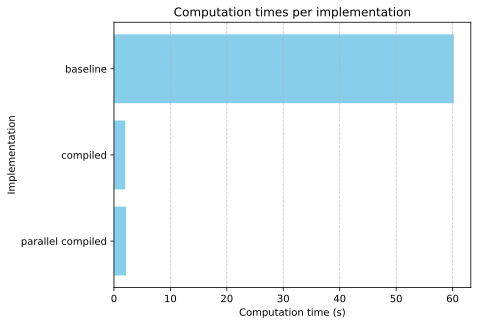

In [16]:
plt.barh(list(computation_times.keys()), list(computation_times.values()), color='skyblue')
plt.xlabel('Computation time (s)')
plt.ylabel('Implementation')
plt.title('Computation times per implementation')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()
show_plot()

# Conclusions

The parallelized version runs a bit longer than the simply compiled version, possibly due to overhead of creating threads. However, it is still significantly faster than the non-compiled baseline version.

## GPU Implementation of SDM Kernel

In [17]:
from numba import cuda

@cuda.jit
def sdm_gpu_kernel(pairs, u01, mult, mass, b_per_s, dt, dv, output_mass):
    i = cuda.grid(1)
    if i < pairs.shape[0]:
        i1 = pairs[i, 0]
        i2 = pairs[i, 1]
        m1 = mass[i1]
        m2 = mass[i2]
        beta = b_per_s
        prob = beta * dt / dv
        if u01[i] < prob:
            output_mass[i1] = 0.0
            output_mass[i2] = 0.0
            output_mass[i] = m1 + m2
            mult[i] = mult[i1] + mult[i2]
        else:
            output_mass[i] = 0.0


In [18]:
def sdm_gpu(*, pairs, u01, mult, mass, b_per_s, dt, dv):
    from numba import cuda
    n_pairs = pairs.shape[0]
    threads_per_block = 128
    blocks_per_grid = (n_pairs + (threads_per_block - 1)) // threads_per_block

    # Allocate GPU memory
    d_pairs = cuda.to_device(pairs)
    d_u01 = cuda.to_device(u01)
    d_mult = cuda.to_device(mult)
    d_mass = cuda.to_device(mass)
    d_output_mass = cuda.device_array_like(mass)

    # Launch kernel
    sdm_gpu_kernel[blocks_per_grid, threads_per_block](d_pairs, d_u01, d_mult, d_mass, b_per_s, dt, dv, d_output_mass)
    cuda.synchronize()

    return d_output_mass.copy_to_host(), d_mult.copy_to_host()


## Automated Tests

In [19]:
def test_bitwise_equivalence():
    particles_ref = sample(params_comp=PARAMS_COMPUTATIONAL, params_phys=PARAMS_PHYSICAL, rng=RNG)
    particles_cpu = deepcopy(particles_ref)
    particles_gpu = deepcopy(particles_ref)

    pairs = np.array(list(combinations(range(PARAMS_COMPUTATIONAL.n_part), 2)))
    u01 = RNG.random(len(pairs))

    mass = particles_ref.mass.copy()
    mult = particles_ref.mult.copy()

    out_mass_seq = mass.copy()
    out_mass_par, _ = sdm_parallel(pairs=pairs, u01=u01, mult=mult.copy(), mass=mass.copy(),
                                   b_per_s=PARAMS_PHYSICAL.b_per_s, dt=PARAMS_COMPUTATIONAL.dt_s,
                                   dv=PARAMS_PHYSICAL.dv_m3)

    try:
        out_mass_gpu, _ = sdm_gpu(pairs=pairs, u01=u01, mult=mult.copy(), mass=mass.copy(),
                                  b_per_s=PARAMS_PHYSICAL.b_per_s, dt=PARAMS_COMPUTATIONAL.dt_s,
                                  dv=PARAMS_PHYSICAL.dv_m3)
    except Exception as e:
        print("GPU test skipped (e.g. not available):", e)
        out_mass_gpu = out_mass_par  # fallback for comparison

    assert np.allclose(out_mass_seq, out_mass_par), "CPU parallel and sequential results differ!"
    assert np.allclose(out_mass_par, out_mass_gpu), "GPU and CPU parallel results differ!"
    print("Bitwise/float comparison across modes passed.")


In [21]:
def test_analytic_match():
    particles = sample(params_comp=PARAMS_COMPUTATIONAL, params_phys=PARAMS_PHYSICAL, rng=RNG)
    simulate(params_phys=PARAMS_PHYSICAL, params_comp=PARAMS_COMPUTATIONAL,
             particles=particles, rng=RNG, sdm_fn=sdm_parallel)

    final_mass = particles.mass[particles.mass > 0]
    hist, bin_edges = np.histogram(np.log10(final_mass), bins=PARAMS_BINS.count,
                                   range=(PARAMS_BINS.min_x, PARAMS_BINS.max_x), density=True)

    bin_centers = 10 ** ((bin_edges[:-1] + bin_edges[1:]) / 2)
    analytic = analytic_solution(bin_centers, PARAMS_COMPUTATIONAL.t_max_s, PARAMS_PHYSICAL)

    plt.plot(bin_centers, hist, label='Simulated')
    plt.plot(bin_centers, analytic, label='Analytic', linestyle='dashed')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend()
    plt.title("Comparison with Analytic Solution")
    plt.show()
